# Baixando o datashet, plotando as colunas e descrevendo o dataset



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import kagglehub
from scipy.stats import skew
import numpy as np

path = kagglehub.dataset_download("valakhorasani/gym-members-exercise-dataset")
df = pd.read_csv(f"{path}/gym_members_exercise_tracking.csv")  # Certifique-se de que este é o nome correto do arquivo

print(df.columns) #nomes das colunas

numeric_columns = df.select_dtypes(include=['float64', 'int64'])
from scipy.stats import skew

stats = numeric_columns.aggregate(['mean', 'std']).T
stats['skewness'] = numeric_columns.apply(skew) # média, desvio padrão e assimetria

print(stats)

# classificando:
categorical_variable = 'Gender'

numeric_columns = df.select_dtypes(include='number')
grouped = df.groupby(categorical_variable)

def calculate_statistics(group):
    return pd.DataFrame({
        'mean': group[numeric_columns.columns].mean(),
        'std': group[numeric_columns.columns].std(),
        'skewness': group[numeric_columns.columns].apply(skew, nan_policy='omit')
    })

resultado = grouped.apply(calculate_statistics)
print(resultado)


100%|██████████| 21.6k/21.6k [00:00<00:00, 6.51MB/s]

Extracting files...
Index(['Age', 'Gender', 'Weight (kg)', 'Height (m)', 'Max_BPM', 'Avg_BPM',
       'Resting_BPM', 'Session_Duration (hours)', 'Calories_Burned',
       'Workout_Type', 'Fat_Percentage', 'Water_Intake (liters)',
       'Workout_Frequency (days/week)', 'Experience_Level', 'BMI'],
      dtype='object')
                                     mean         std  skewness
Age                             38.683453   12.180928 -0.077744
Weight (kg)                     73.854676   21.207500  0.771193
Height (m)                       1.722580    0.127720  0.338336
Max_BPM                        179.883864   11.525686 -0.037892
Avg_BPM                        143.766701   14.345101  0.086228
Resting_BPM                     62.223022    7.327060 -0.071525
Session_Duration (hours)         1.256423    0.343033  0.025721
Calories_Burned                905.422405  272.641516  0.277892
Fat_Percentage                  24.976773    6.259419 -0.634245
Water_Intake (liters)            2.62661


<ipython-input-3-6c4ec311a143>:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  resultado = grouped.apply(calculate_statistics)


# Histograma e Estatísticas Univariadas dos preditores da análise incondicional monovariada



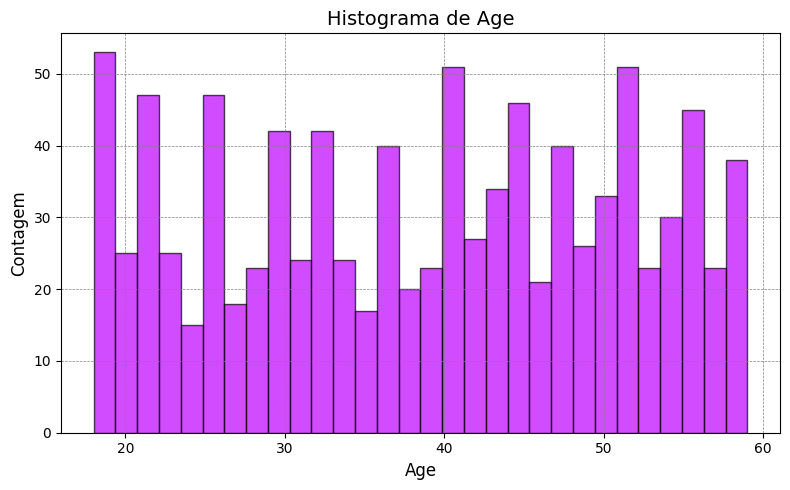

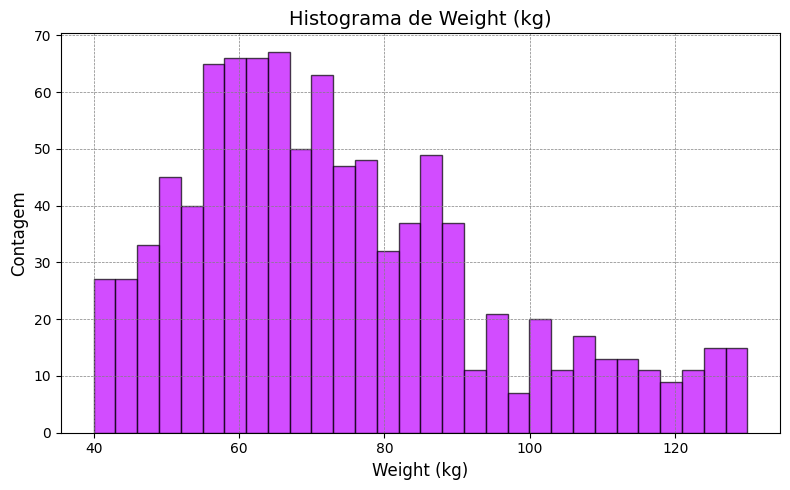

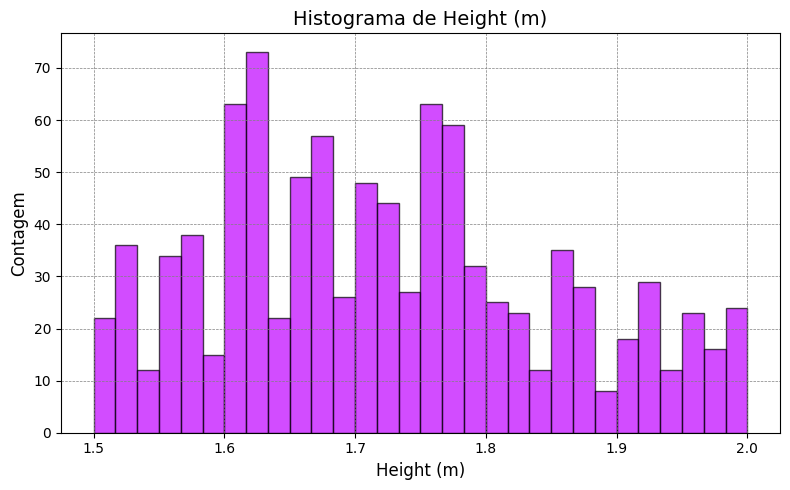

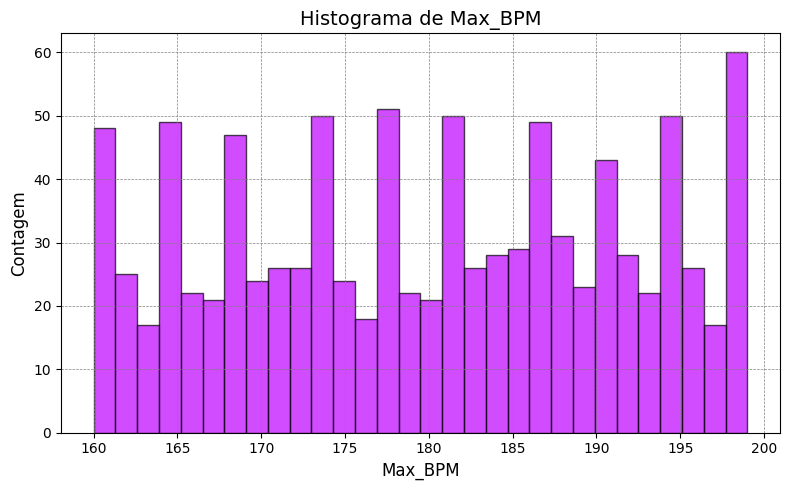

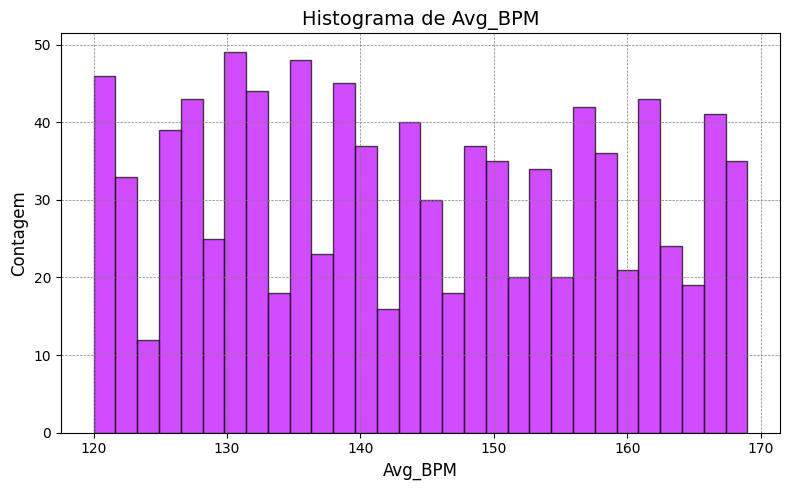

...

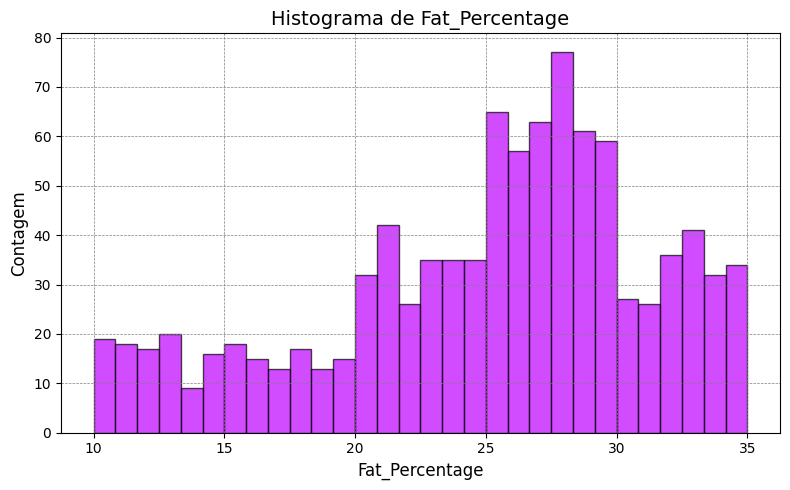

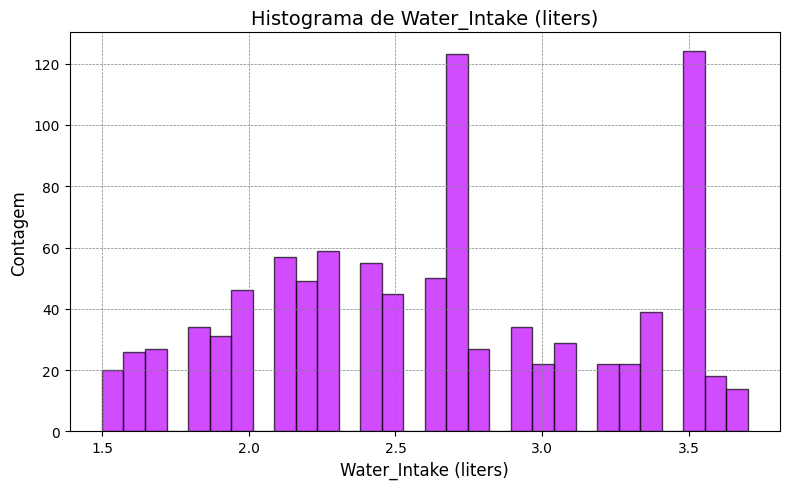

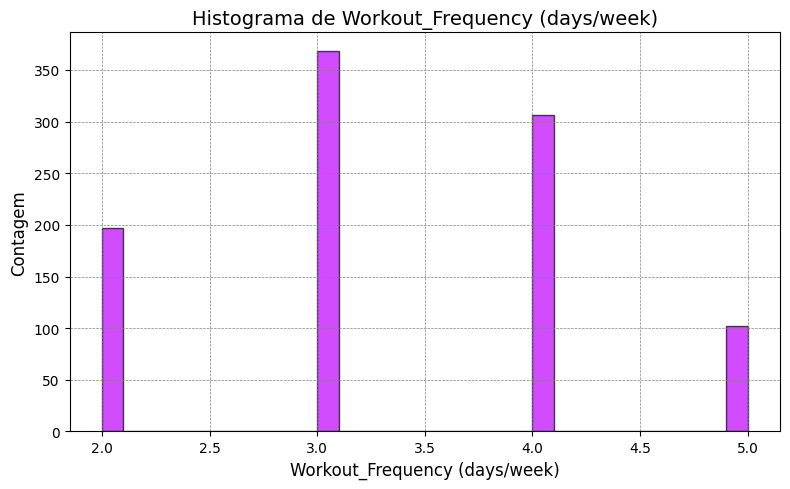

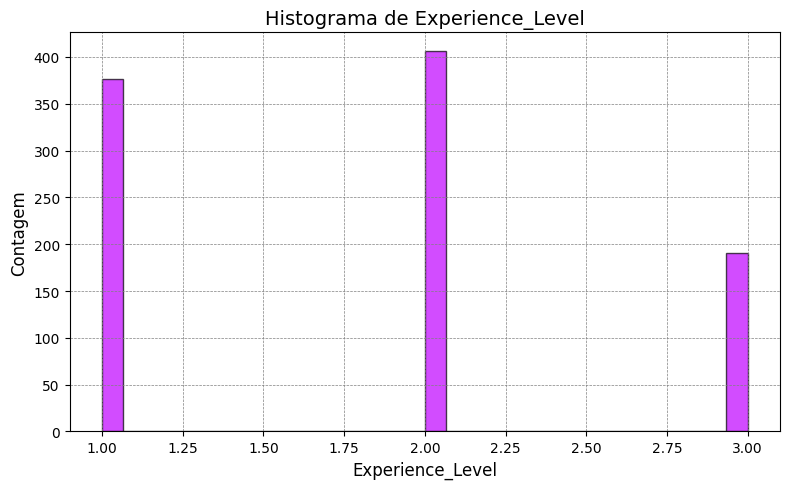

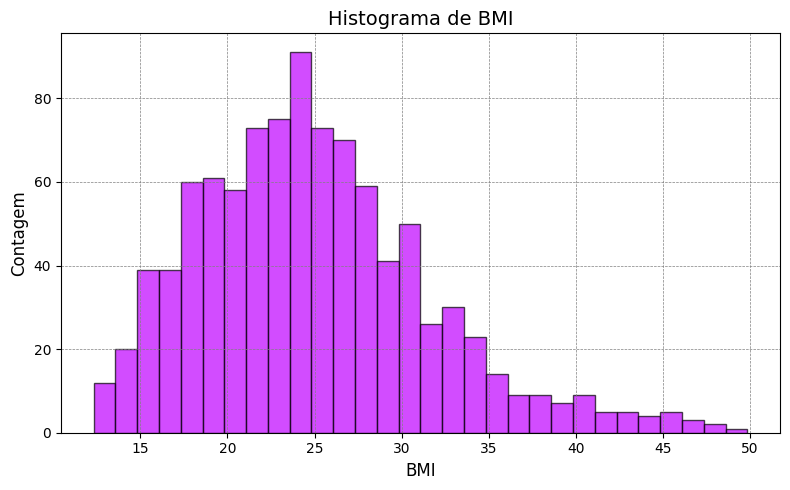

Estatísticas Univariadas (Média, Desvio Padrão, Assimetria):
Age:
  Média: 38.68
  Desvio Padrão: 12.18
  Assimetria: -0.08

Weight (kg):
  Média: 73.85
  Desvio Padrão: 21.21
  Assimetria: 0.77

Height (m):
  Média: 1.72
  Desvio Padrão: 0.13
  Assimetria: 0.34

Max_BPM:
  Média: 179.88
  Desvio Padrão: 11.53
  Assimetria: -0.04

Avg_BPM:
  Média: 143.77
  Desvio Padrão: 14.35
  Assimetria: 0.09

Resting_BPM:
  Média: 62.22
  Desvio Padrão: 7.33
  Assimetria: -0.07

Session_Duration (hours):
  Média: 1.26
  Desvio Padrão: 0.34
  Assimetria: 0.03

Calories_Burned:
  Média: 905.42
  Desvio Padrão: 272.64
  Assimetria: 0.28

Fat_Percentage:
  Média: 24.98
  Desvio Padrão: 6.26
  Assimetria: -0.63

Water_Intake (liters):
  Média: 2.63
  Desvio Padrão: 0.60
  Assimetria: 0.07

Workout_Frequency (days/week):
  Média: 3.32
  Desvio Padrão: 0.91
  Assimetria: 0.15

Experience_Level:
  Média: 1.81
  Desvio Padrão: 0.74
  Assimetria: 0.32

BMI:
  Média: 24.91
  Desvio Padrão: 6.66
  Assimetria:

In [ ]:
predictors = df.drop(columns=["Gender", "Workout_Type"]).columns

stats = {}

for column in predictors:
    #Dados da coluna (removendo valores NaN)
    data = df[column].dropna()

    mean = data.mean()
    std_dev = data.std()
    skewness = skew(data)

    stats[column] = {"Mean": mean, "Std Dev": std_dev, "Skewness": skewness}

    # Configurar o histograma
    plt.figure(figsize=(8, 5))
    plt.hist(data, bins=30, color='#BF00FF', edgecolor='black', alpha=0.7)


    # Títulos e labels
    plt.title(f'Histograma de {column}', fontsize=14)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Contagem', fontsize=12)

    # Adicionar grid
    plt.grid(color='gray', linestyle='--', linewidth=0.5)

    # Exibir o gráfico
    plt.tight_layout()
    plt.show()

# Exibir as estatísticas calculadas
print("Estatísticas Univariadas (Média, Desvio Padrão, Assimetria):")
for predictor, stat in stats.items():
    print(f"{predictor}:")
    print(f"  Média: {stat['Mean']:.2f}")
    print(f"  Desvio Padrão: {stat['Std Dev']:.2f}")
    print(f"  Assimetria: {stat['Skewness']:.2f}")
    print()


# Boxplot de cada preditor

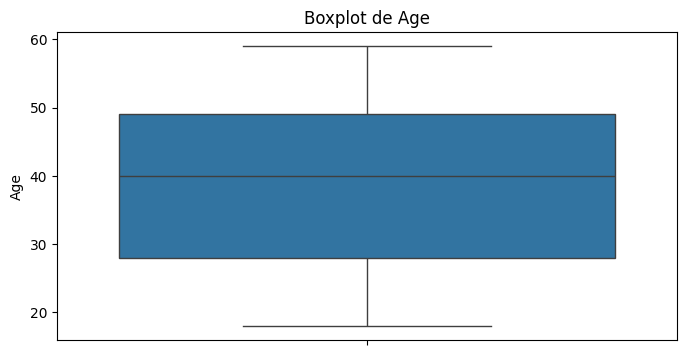

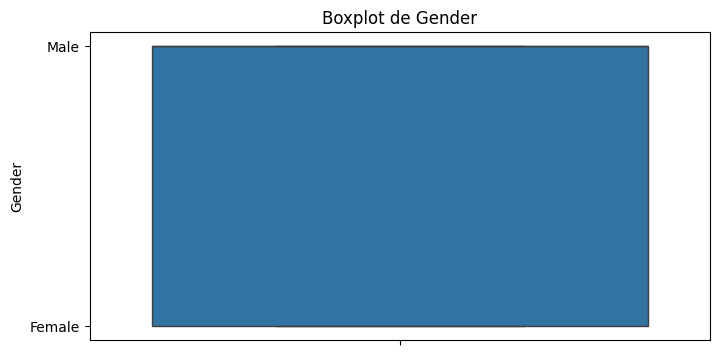

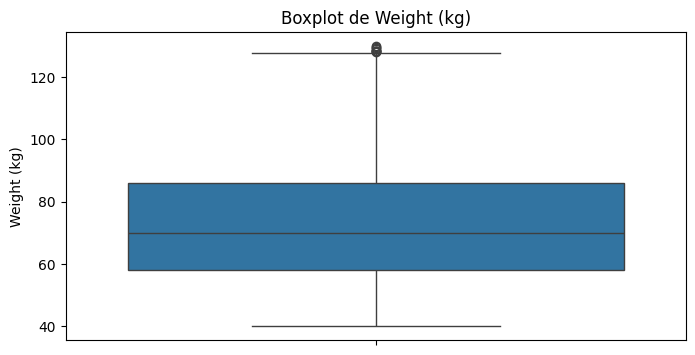

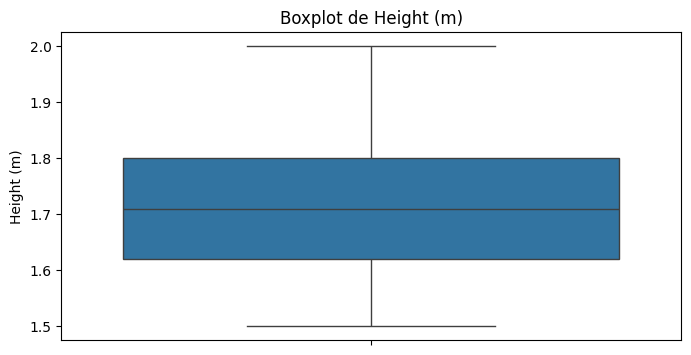

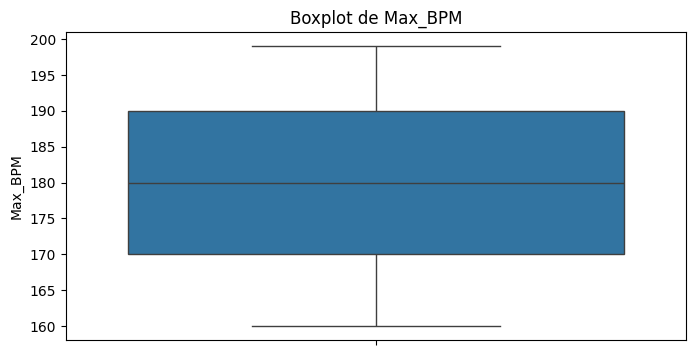

...

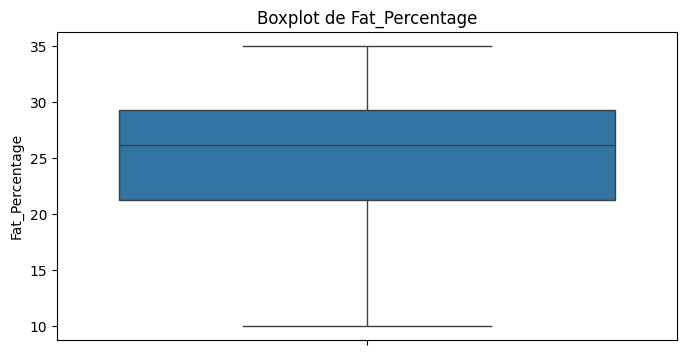

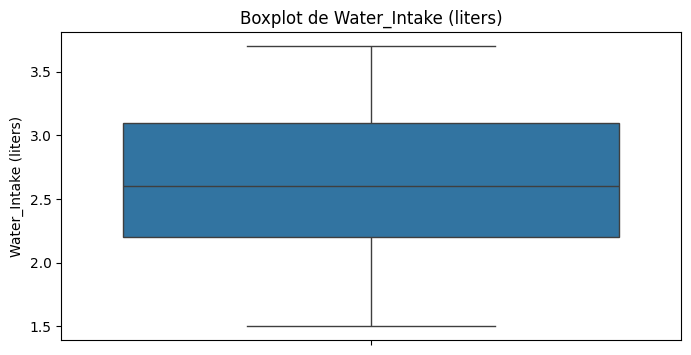

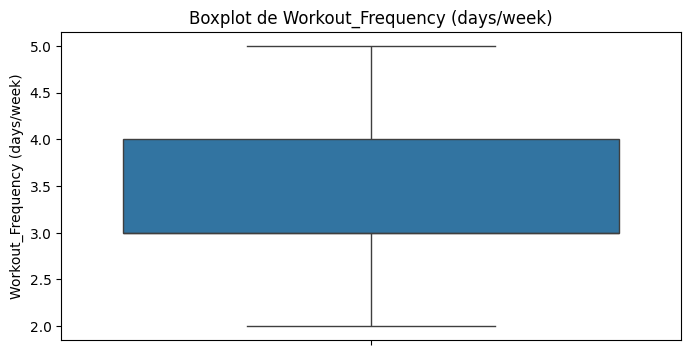

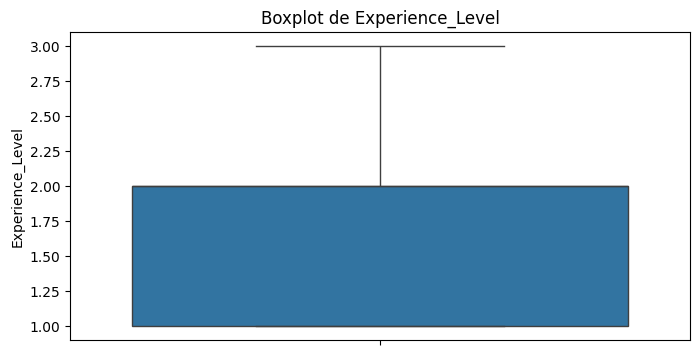

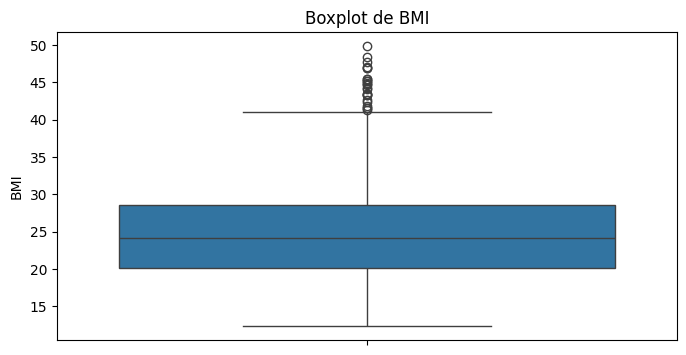

In [ ]:
for coluna in df.columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(y=df[coluna])
    plt.title(f'Boxplot de {coluna}')
    plt.show()

# Boxplot de preditores com outliers

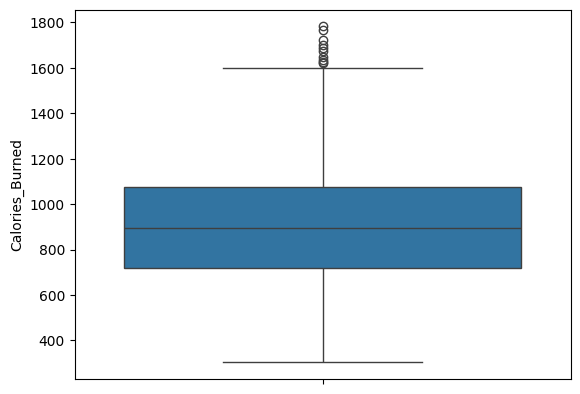

In [ ]:
sns.boxplot(y=df['Calories_Burned'])
plt.show()

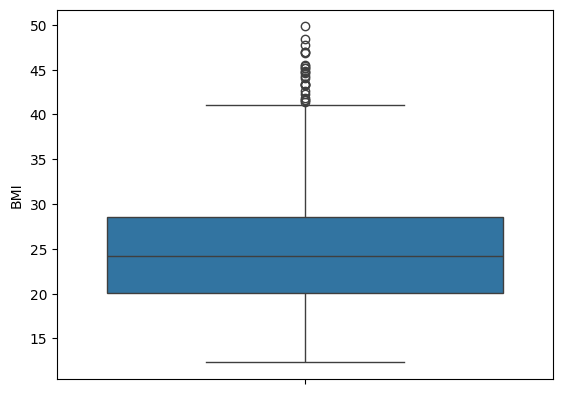

In [ ]:
sns.boxplot(y=df['BMI'])
plt.show()

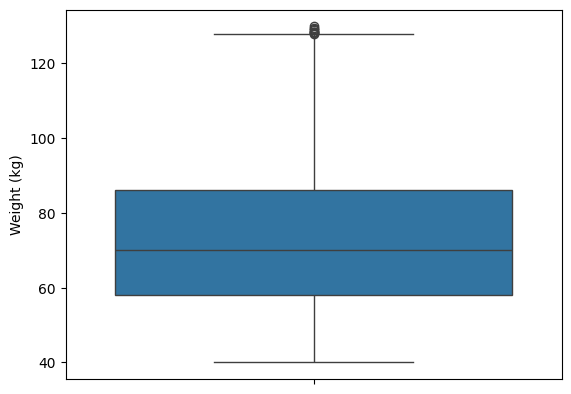

In [ ]:
sns.boxplot(y=df['Weight (kg)'])
plt.show()

# Histograma e Estatísticas Univariadas da análise monovariada condicional

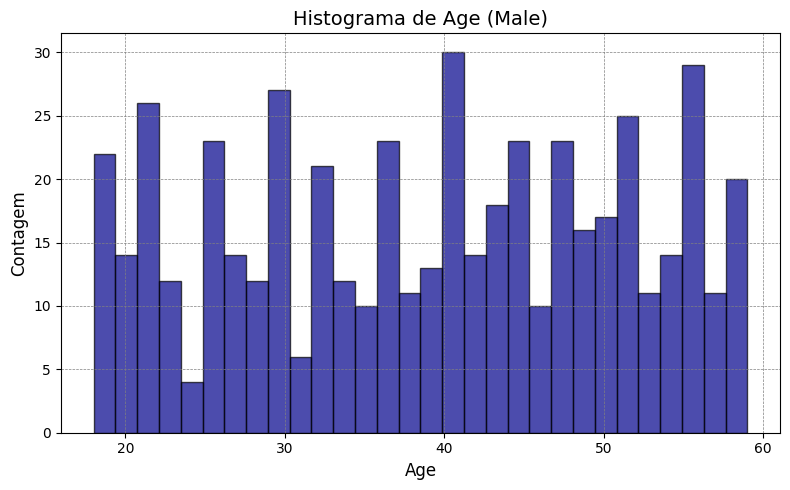

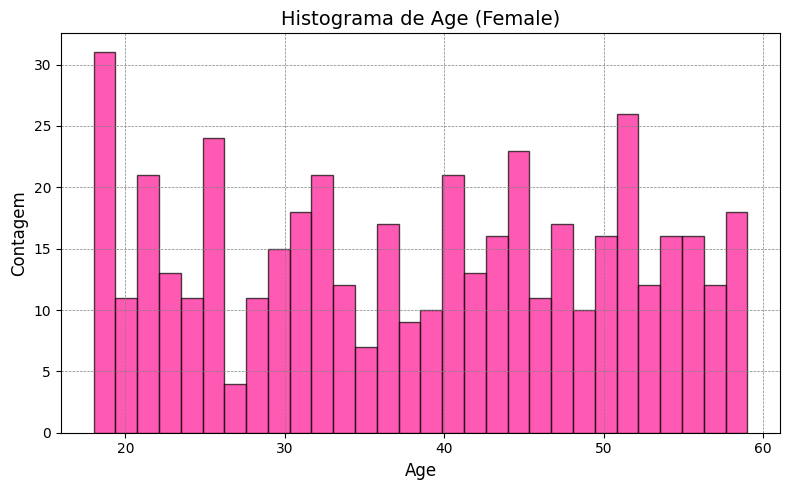

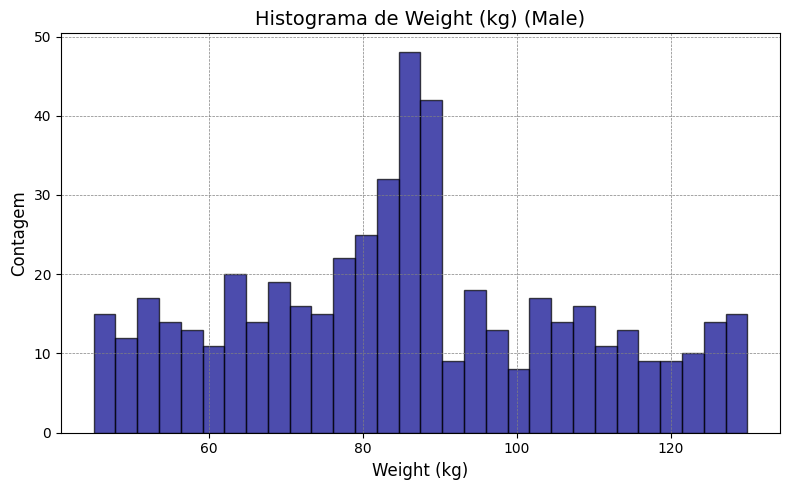

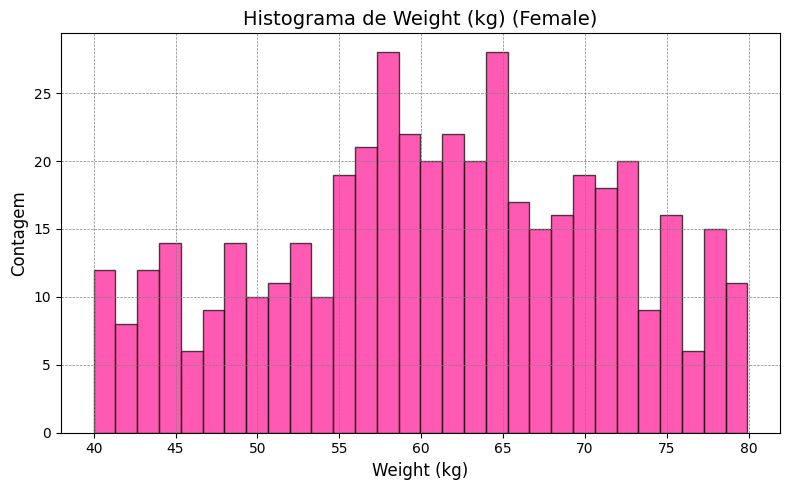

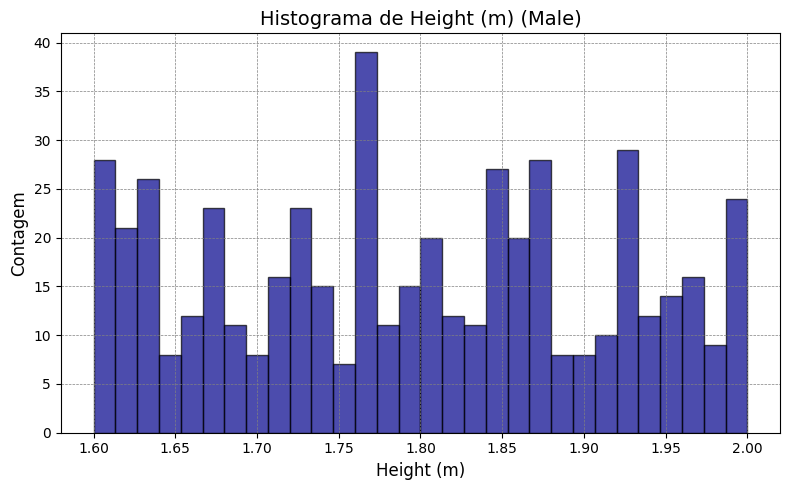

...

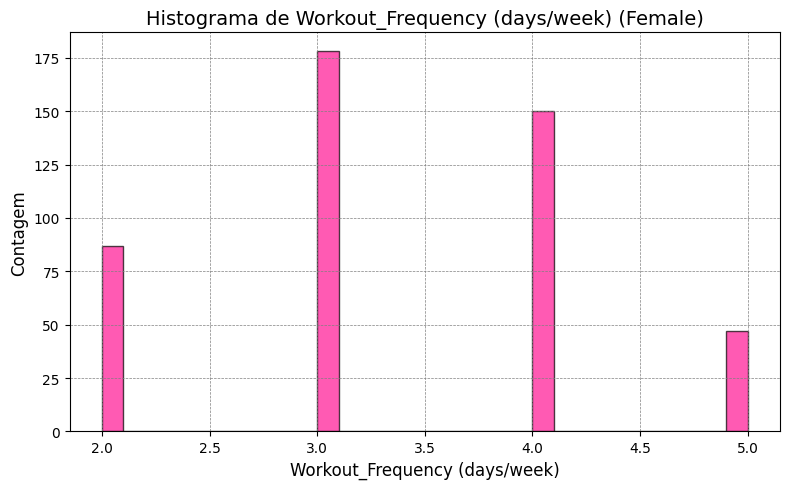

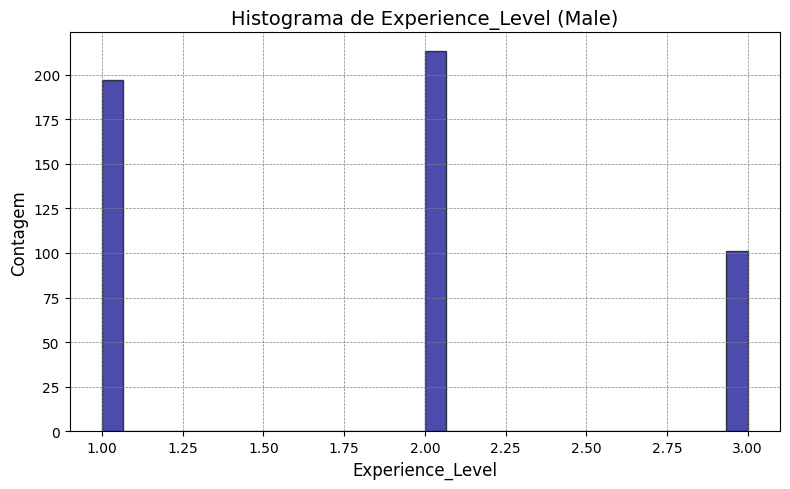

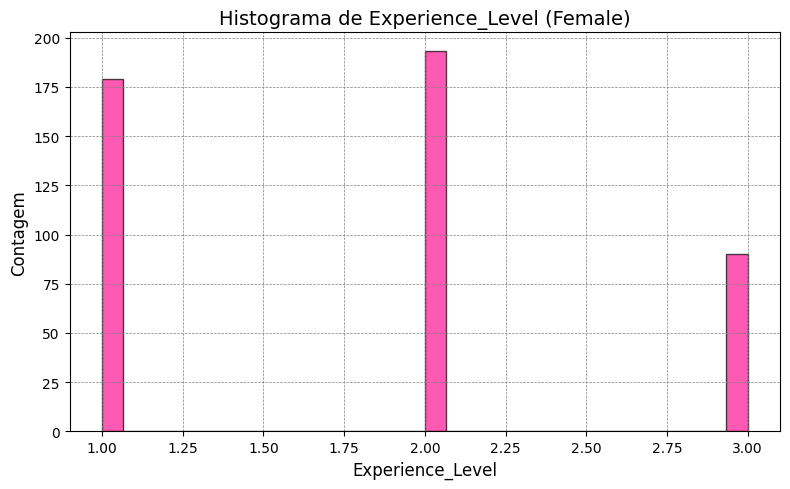

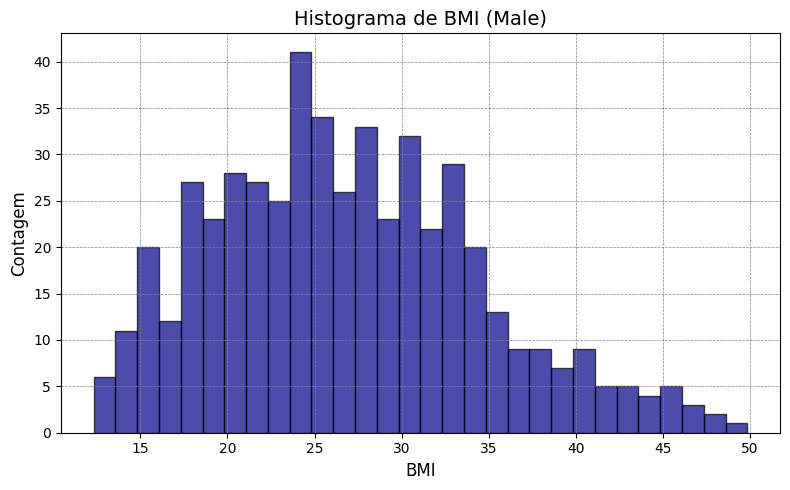

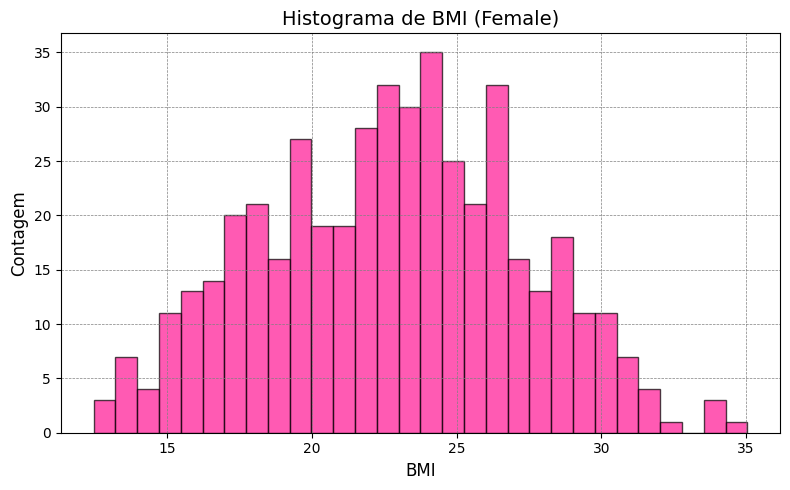

Estatísticas Univariadas por Gênero:

Estatísticas para Male:
Age:
  Média: 39.00
  Desvio Padrão: 12.05
  Assimetria: -0.09

Weight (kg):
  Média: 85.53
  Desvio Padrão: 21.79
  Assimetria: 0.15

Height (m):
  Média: 1.79
  Desvio Padrão: 0.12
  Assimetria: 0.03

Max_BPM:
  Média: 180.00
  Desvio Padrão: 11.68
  Assimetria: -0.05

Avg_BPM:
  Média: 143.90
  Desvio Padrão: 14.30
  Assimetria: 0.11

Resting_BPM:
  Média: 62.32
  Desvio Padrão: 7.40
  Assimetria: -0.13

Session_Duration (hours):
  Média: 1.25
  Desvio Padrão: 0.34
  Assimetria: -0.01

Calories_Burned:
  Média: 944.46
  Desvio Padrão: 286.59
  Assimetria: 0.26

Fat_Percentage:
  Média: 22.55
  Desvio Padrão: 5.73
  Assimetria: -0.84

Water_Intake (liters):
  Média: 3.01
  Desvio Padrão: 0.49
  Assimetria: -0.46

Workout_Frequency (days/week):
  Média: 3.31
  Desvio Padrão: 0.93
  Assimetria: 0.17

Experience_Level:
  Média: 1.81
  Desvio Padrão: 0.74
  Assimetria: 0.31

BMI:
  Média: 26.89
  Desvio Padrão: 7.63
  Assimetr

In [ ]:
# Inicializar dicionários para armazenar estatísticas por gênero
stats_male = {}
stats_female = {}

for column in predictors:
    # Filtrar dados por gênero
    data_male = df[df["Gender"] == "Male"][column].dropna()
    data_female = df[df["Gender"] == "Female"][column].dropna()

    # Calcular estatísticas para "Male"
    mean_male = data_male.mean()
    std_dev_male = data_male.std()
    skewness_male = skew(data_male)

    stats_male[column] = {
        "Mean": mean_male,
        "Std Dev": std_dev_male,
        "Skewness": skewness_male,
    }

    # Calcular estatísticas para "Female"
    mean_female = data_female.mean()
    std_dev_female = data_female.std()
    skewness_female = skew(data_female)

    stats_female[column] = {
        "Mean": mean_female,
        "Std Dev": std_dev_female,
        "Skewness": skewness_female,
    }

    # Plotar histograma para "Male"
    plt.figure(figsize=(8, 5))
    plt.hist(
        data_male, bins=30, color='#00008B', edgecolor='black', alpha=0.7
    )
    plt.title(f'Histograma de {column} (Male)', fontsize=14)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Contagem', fontsize=12)
    plt.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

    # Plotar histograma para "Female"
    plt.figure(figsize=(8, 5))
    plt.hist(
        data_female, bins=30, color='#FF1493', edgecolor='black', alpha=0.7
    )
    plt.title(f'Histograma de {column} (Female)', fontsize=14)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Contagem', fontsize=12)
    plt.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# Exibir as estatísticas calculadas
print("Estatísticas Univariadas por Gênero:")

print("\nEstatísticas para Male:")
for predictor, stat in stats_male.items():
    print(f"{predictor}:")
    print(f"  Média: {stat['Mean']:.2f}")
    print(f"  Desvio Padrão: {stat['Std Dev']:.2f}")
    print(f"  Assimetria: {stat['Skewness']:.2f}")
    print()

print("\nEstatísticas para Female:")
for predictor, stat in stats_female.items():
    print(f"{predictor}:")
    print(f"  Média: {stat['Mean']:.2f}")
    print(f"  Desvio Padrão: {stat['Std Dev']:.2f}")
    print(f"  Assimetria: {stat['Skewness']:.2f}")
    print()


# Dispersão dos todos os pares de preditores

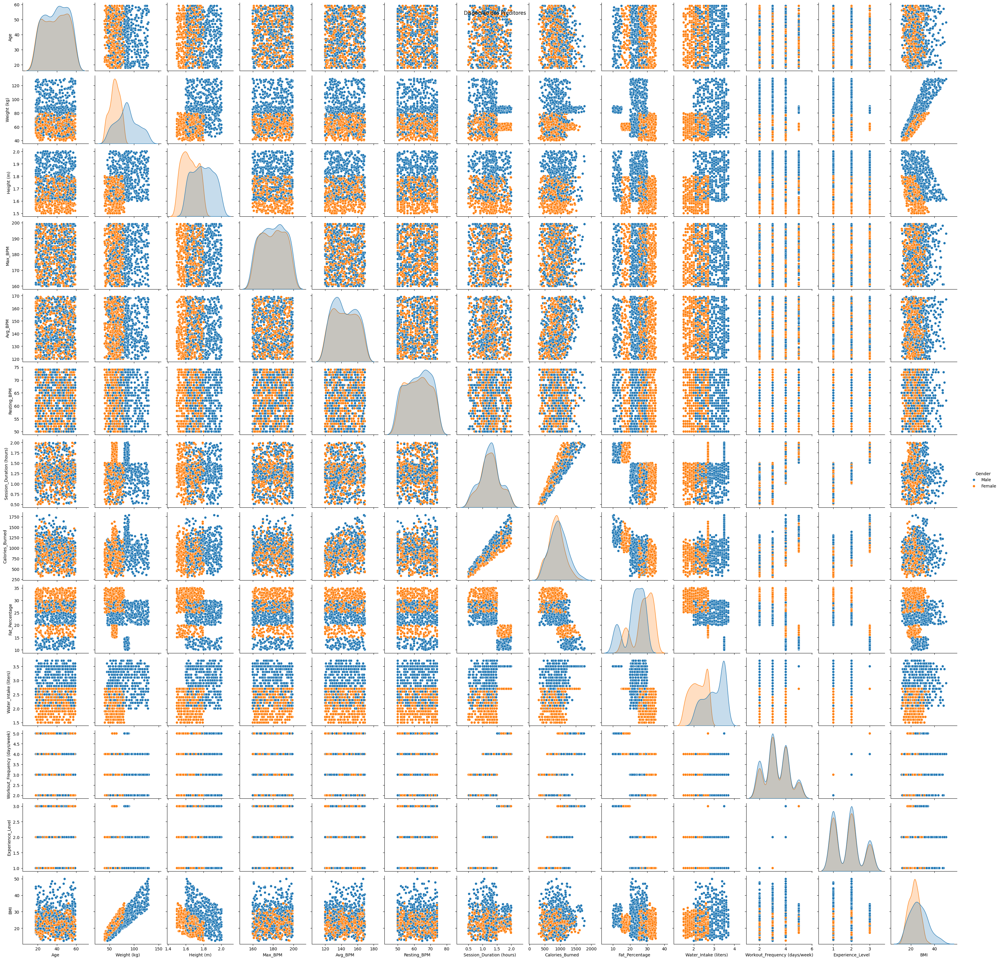

In [ ]:
sns.pairplot(df, hue='Gender' , vars=['Fat_Percentage', 'Age'], diag_kind='kde', kind='scatter')

# Ajustando o layout
plt.suptitle("Dispersão dos Preditores")
plt.show()

# Grafico de correlaçao linear entre os preditores



# Boxplot de cada preditor de acordo com o gênero

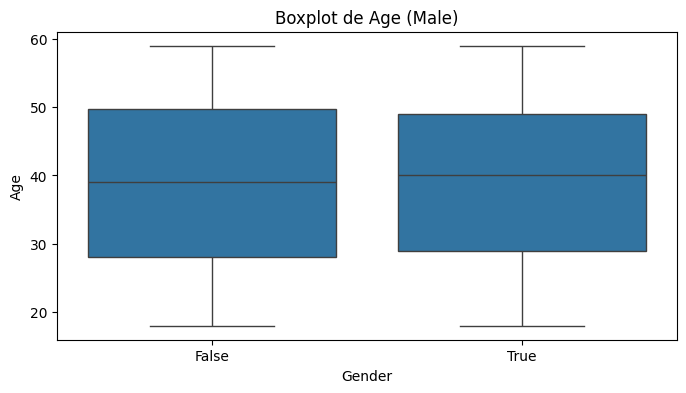

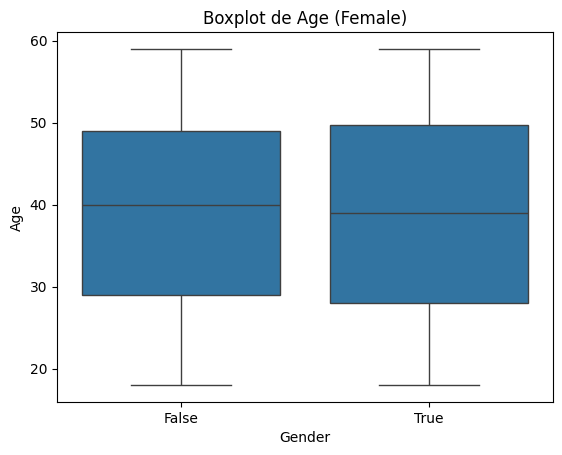

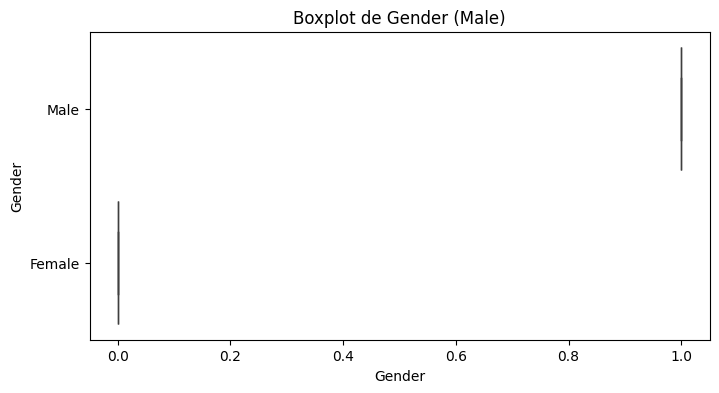

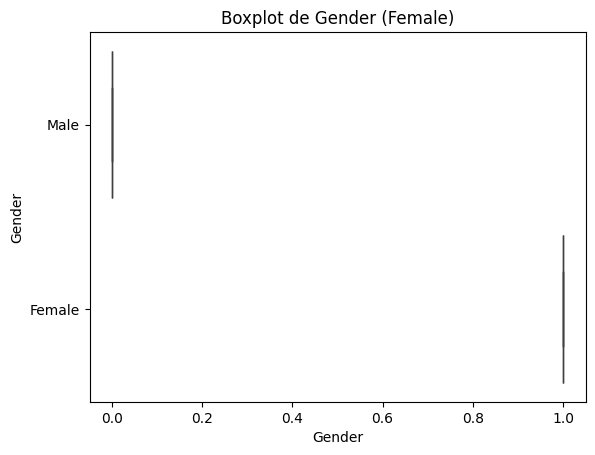

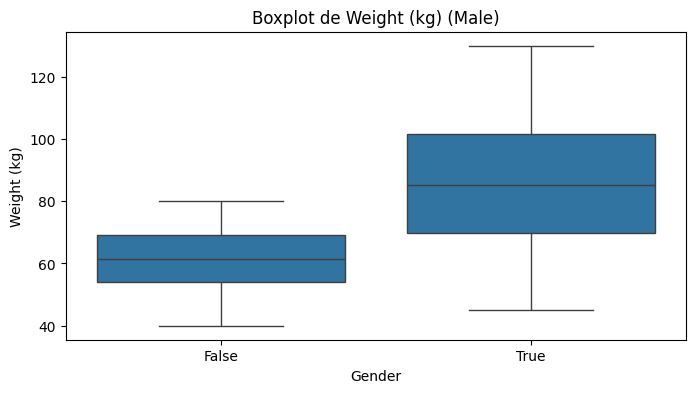

...

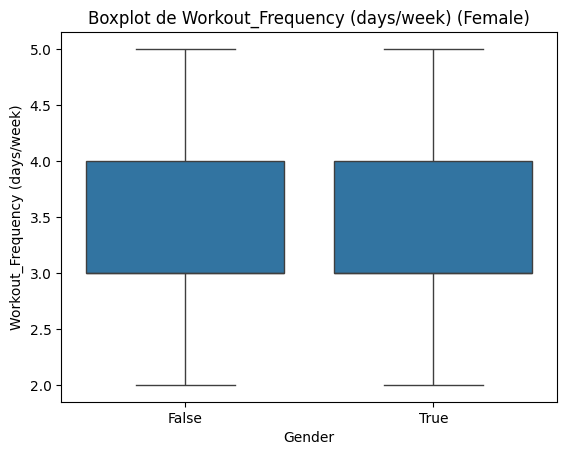

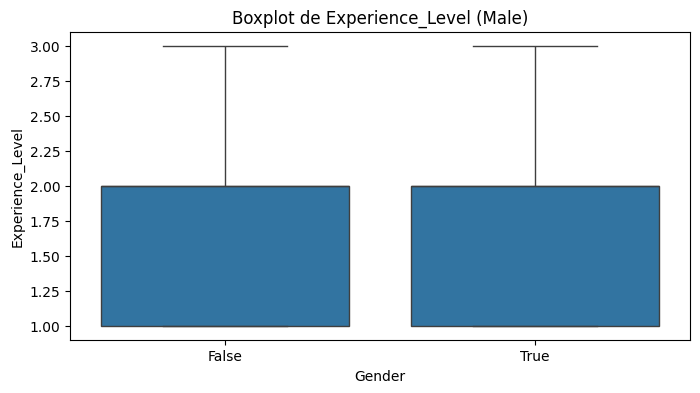

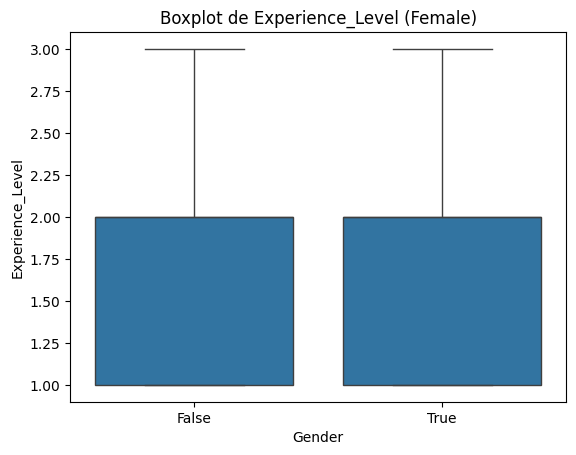

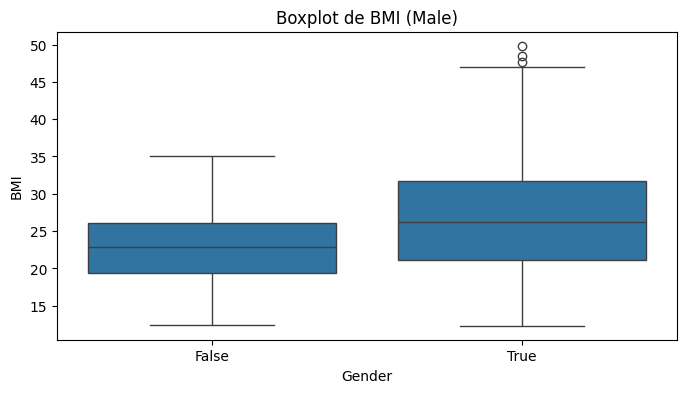

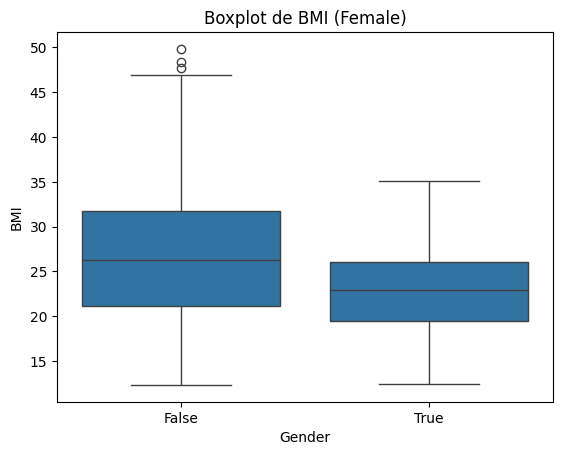

In [ ]:
for coluna in df.columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(y=df[coluna],x=df["Gender"] == "Male")
    plt.title(f'Boxplot de {coluna} (Male)')
    plt.show()
    sns.boxplot(y=df[coluna],x=df["Gender"] == "Female")
    plt.title(f'Boxplot de {coluna} (Female)')
    plt.show()

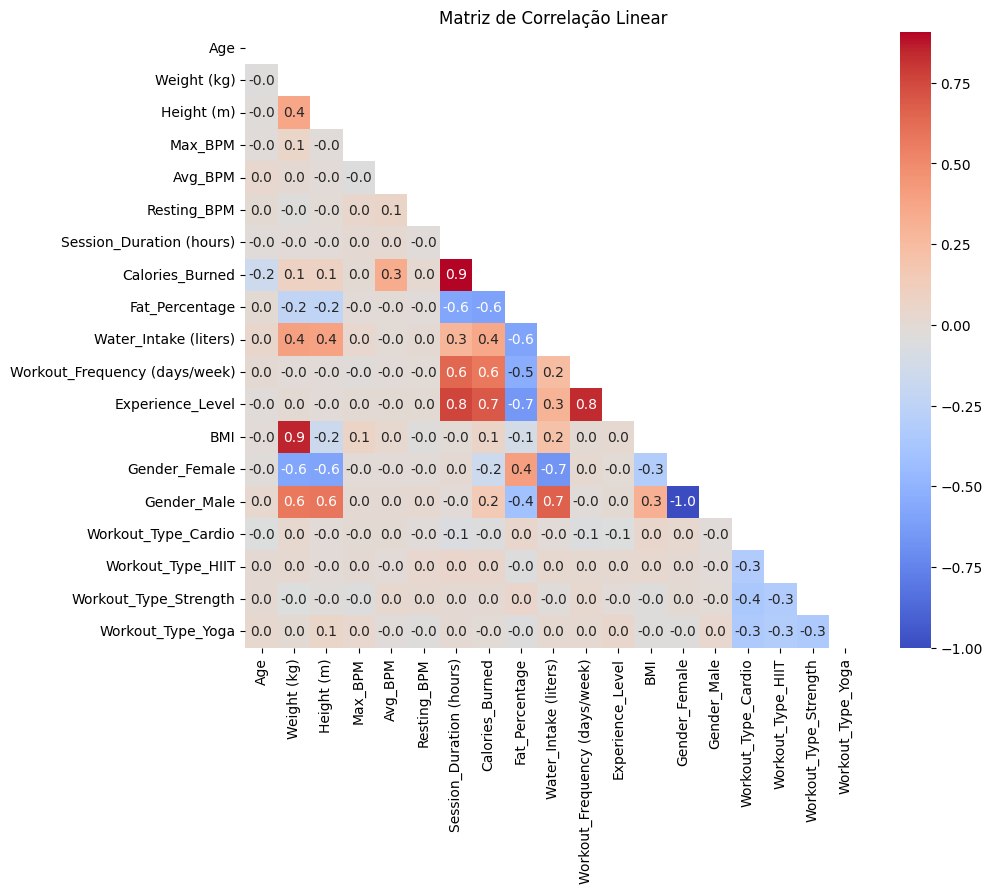

In [ ]:
df_numerico = pd.get_dummies(df)

# Calculando a matriz de correlação
correlacao = df_numerico.corr()

mask = np.triu(np.ones_like(correlacao, dtype=bool))

# Criando o gráfico de calor da matriz de correlação
plt.figure(figsize=(10, 8))
sns.heatmap(correlacao, mask=mask, annot=True, fmt=".1f", cmap="coolwarm", cbar=True, square=True)

# Adicionando título
plt.title("Matriz de Correlação Linear")
plt.show()

# PCA dos dois componentes principais



   Age  Gender  Weight (kg)  Height (m)  Max_BPM  Avg_BPM  Resting_BPM  \
0   56    Male         88.3        1.71      180      157           60   
1   46  Female         74.9        1.53      179      151           66   
2   32  Female         68.1        1.66      167      122           54   
3   25    Male         53.2        1.70      190      164           56   
4   38    Male         46.1        1.79      188      158           68   

   Session_Duration (hours)  Calories_Burned Workout_Type  Fat_Percentage  \
0                      1.69           1313.0         Yoga            12.6   
1                      1.30            883.0         HIIT            33.9   
2                      1.11            677.0       Cardio            33.4   
3                      0.59            532.0     Strength            28.8   
4                      0.64            556.0     Strength            29.2   

   Water_Intake (liters)  Workout_Frequency (days/week)  Experience_Level  \
0              

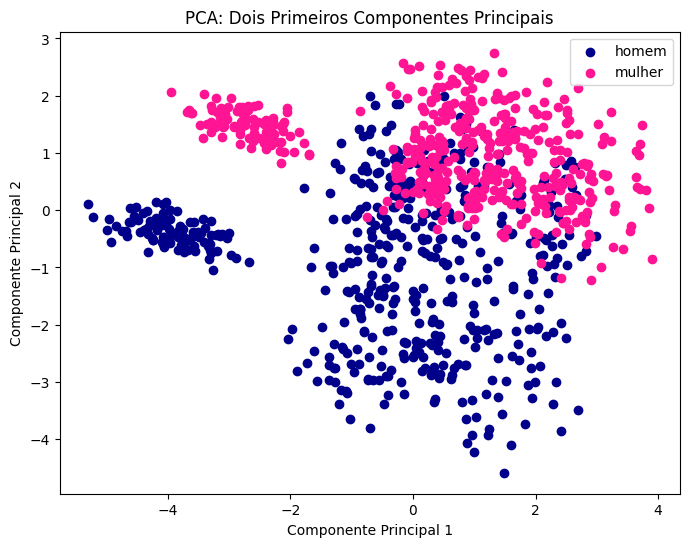

In [ ]:
from sklearn.preprocessing import StandardScaler

data = pd.read_csv(f"{path}/gym_members_exercise_tracking.csv")

print(data.head())
# excluindo não numéricas
features = data[['Age', 'Weight (kg)', 'Height (m)', 'Max_BPM', 'Avg_BPM',
                 'Resting_BPM', 'Session_Duration (hours)', 'Calories_Burned',
                 'Fat_Percentage', 'Water_Intake (liters)',
                 'Workout_Frequency (days/week)', 'Experience_Level', 'BMI']].values

classes = data['Gender'].values

print("Valores únicos de 'Gender':", np.unique(classes))
classes = np.where(classes == 'Male', 'homem', 'mulher')
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

print("Formato de features_scaled:", features_scaled.shape)
print("Valores NaN:", np.isnan(features_scaled).sum())
print("Valores Inf:", np.isinf(features_scaled).sum())

#matriz de covariância
cov_matrix = np.cov(features_scaled.T)
print("Matriz de Covariância:\n", cov_matrix)

#autovalores e autovetores
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

#autovalores em ordem decrescente
sorted_indices = np.argsort(eigenvalues)[::-1]
sorted_eigenvalues = eigenvalues[sorted_indices]
sorted_eigenvectors = eigenvectors[:, sorted_indices]

#resultados dos autovalores e autovetores
print("Autovalores:", sorted_eigenvalues)
print("Autovetores:\n", sorted_eigenvectors)

#dois primeiros autovetores
top2_eigenvectors = sorted_eigenvectors[:, :2]

#projeção dos dados nos dois primeiros componentes principais
projected_data = np.dot(features_scaled, top2_eigenvectors)
print("Dados projetados:\n", projected_data)

unique_classes = np.unique(classes)

#scatterplot
plt.figure(figsize=(8, 6))
colors = {'homem': '#00008B', 'mulher': '#FF1493'}

for label in unique_classes:
    plt.scatter(
        projected_data[classes == label, 0],  # Eixo x (Componente Principal 1)
        projected_data[classes == label, 1],  # Eixo y (Componente Principal 2)
        label=label,
        color=colors[label]  # Cor personalizada com base na classe
    )
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.title("PCA: Dois Primeiros Componentes Principais")
plt.legend()
plt.show()
